In [1]:
#step 2
import pandas as pd
import json
import urllib.parse
import requests as rq
import base64
import geocoder
import pandas as pd
import geopandas as gpd
import osmnx as ox
import folium
from shapely.geometry import Point
from IPython.display import Image
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
import matplotlib.pyplot as plt

city = "Barcelona, Barcelona, Spain"
location = geocoder.arcgis(city)
latitude = location.lat
longitude = location.lng

%matplotlib inline
ox.__version__

'1.4.0'

In [2]:
#Loading shapefiles with neighborhood boundaries and scraped real estate data
gdfb = gpd.read_file(r'C:/WORK_IAAC/submissions/Data Science III/datascience_III_src/BCN_UNITATS_ADM/0301040100_Barris_UNITATS_ADM.shp', encoding='utf-8')

gdfa = gpd.read_file(r'C:/WORK_IAAC/submissions/Data Science III/datascience_III_src/fotocasa_2018_2.shp')
gdfa.to_crs(25831, inplace=True)

# Create a column in gdfb to store the count of points inside each polygon
gdfb['AdvIn'] = gdfb.geometry.apply(lambda polygon: gdfa.within(polygon).sum())

# Create a function to calculate statistics while ignoring NaN values
def calculate_statistics(values):
    non_nan_values = values[~np.isnan(values)]
    if len(non_nan_values) > 0:
        minimum = np.min(non_nan_values)
        maximum = np.max(non_nan_values)
        median = np.median(non_nan_values)
        mean = np.mean(non_nan_values)
        average = np.average(non_nan_values)
    else:
        minimum = 0
        maximum = 0
        median = 0
        mean = 0
        average = 0
    return minimum, maximum, median, mean, average

# Create columns in gdfb to store the statistics
gdfb['MinPBA'], gdfb['MaxPBA'], gdfb['MedPBA'], gdfb['MeanPBA'], gdfb['AvePBA'] = zip(*gdfb.geometry.apply(
    lambda polygon: calculate_statistics(gdfa[gdfa.within(polygon)]['PriceByAre'].values)
))

gdfb.head()

,ID_ANNEX,ANNEXDESCR,ID_TEMA,TEMA_DESCR,ID_CONJUNT,CONJ_DESCR,ID_SUBCONJ,SCONJ_DESC,ID_ELEMENT,ELEM_DESCR,...,FHEX_COLOR,COL_DESCR,HEX_COLOR7,geometry,AdvIn,MinPBA,MaxPBA,MedPBA,MeanPBA,AvePBA
0,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,...,#E66900,NULL,#73A88F,"POLYGON ((428042.157 4579741.663, 428051.277 4...",87,1545.454545,5557.142857,2877.552553,3118.158214,3118.158214
1,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,...,#E66900,NULL,#73A88F,"POLYGON ((428820.058 4580133.022, 428808.617 4...",45,897.435897,6416.666667,3430.232558,3483.424797,3483.424797
2,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,...,#E66900,NULL,#73A88F,"POLYGON ((430162.188 4581936.985, 430550.104 4...",536,1734.782609,14889.848485,4056.085686,4250.134944,4250.134944
3,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,...,#E66900,NULL,#73A88F,"POLYGON ((431189.907 4581851.447, 431332.429 4...",339,2000.000000,12403.100775,5277.777778,5467.578342,5467.578342
4,01,Grup - I,0104,Unitats Administratives,010413,Barris,01041301,Barri,0104130101,Límit de barri,...,#E66900,NULL,#73A88F,"POLYGON ((432798.734 4582081.260, 432805.852 4...",103,2343.750000,9692.307692,5550.245098,5678.205885,5678.205885


In [3]:
gdfb.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 73 entries, 0 to 72
Data columns (total 55 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   ID_ANNEX    73 non-null     object  
 1   ANNEXDESCR  73 non-null     object  
 2   ID_TEMA     73 non-null     object  
 3   TEMA_DESCR  73 non-null     object  
 4   ID_CONJUNT  73 non-null     object  
 5   CONJ_DESCR  73 non-null     object  
 6   ID_SUBCONJ  73 non-null     object  
 7   SCONJ_DESC  73 non-null     object  
 8   ID_ELEMENT  73 non-null     object  
 9   ELEM_DESCR  73 non-null     object  
 10  NIVELL      73 non-null     object  
 11  NDESCR_CA   73 non-null     object  
 12  NDESCR_ES   73 non-null     object  
 13  NDESCR_EN   73 non-null     object  
 14  TERME       73 non-null     object  
 15  DISTRICTE   73 non-null     object  
 16  BARRI       73 non-null     object  
 17  AEB         73 non-null     object  
 18  SEC_CENS    73 non-null     object  
 19  GR

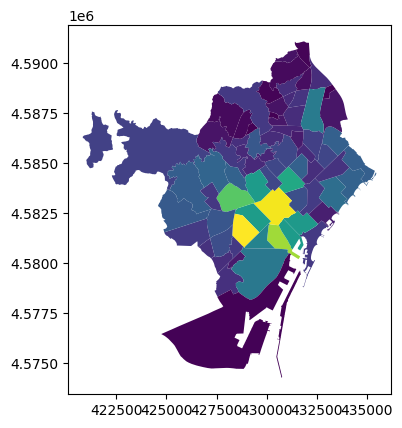

In [4]:
gdfb.plot(column="AdvIn");

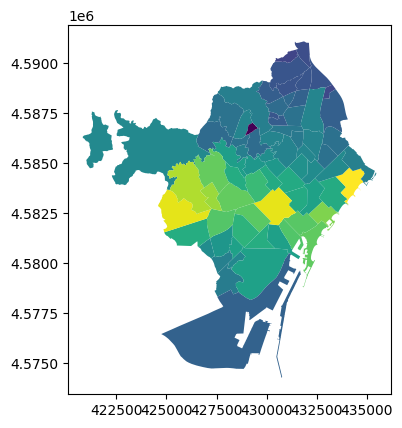

In [5]:
gdfb.plot(column="MeanPBA");

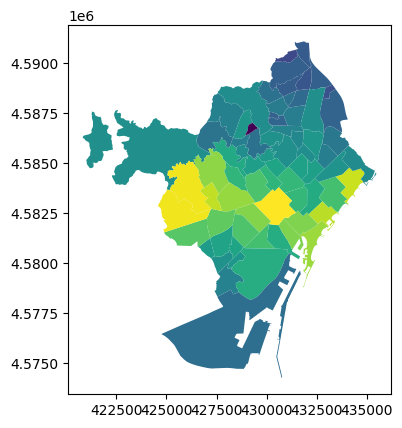

In [6]:
gdfb.plot(column="MedPBA");

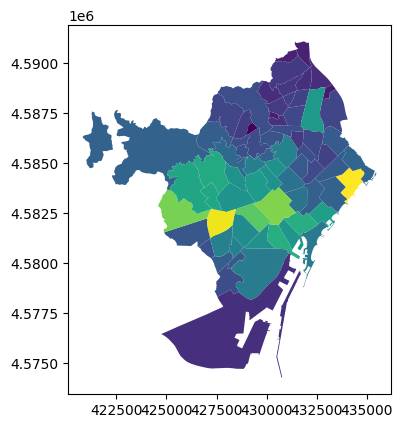

In [7]:
gdfb.plot(column="MaxPBA");

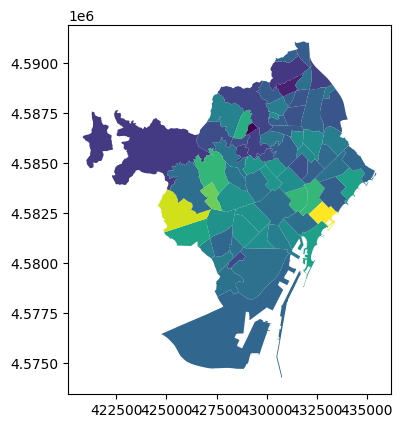

In [8]:
gdfb.plot(column="MinPBA");

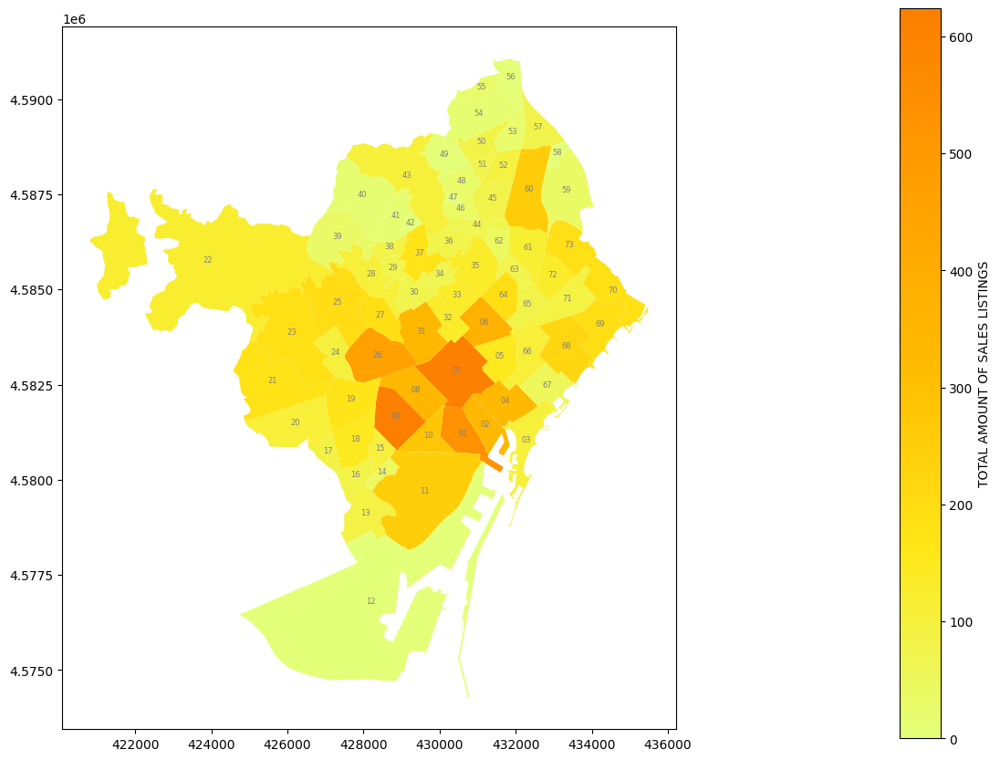

In [9]:
# Set the plot size to full size
fig, ax = plt.subplots(figsize=(15, 10))
totcol = 'Wistia'
# Plot gdfb with the "AdvIn" column
gdfb.plot(column="AdvIn", cmap=totcol, ax=ax)

# Add names of 'BARRI' in the centers of polygons
for idx, row in gdfb.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['BARRI'], ha='center', fontsize=6, color='gray')

# Create a colorbar
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap=totcol)
sm.set_array(gdfb['AdvIn'])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label('TOTAL AMOUNT OF SALES LISTINGS')

plt.show()

In [10]:
# Convert 'BARRI' column to integers and sort in descending order
gdfb['BARRI'] = gdfb['BARRI'].astype(int)
gdfb = gdfb.sort_values('BARRI', ascending=True)

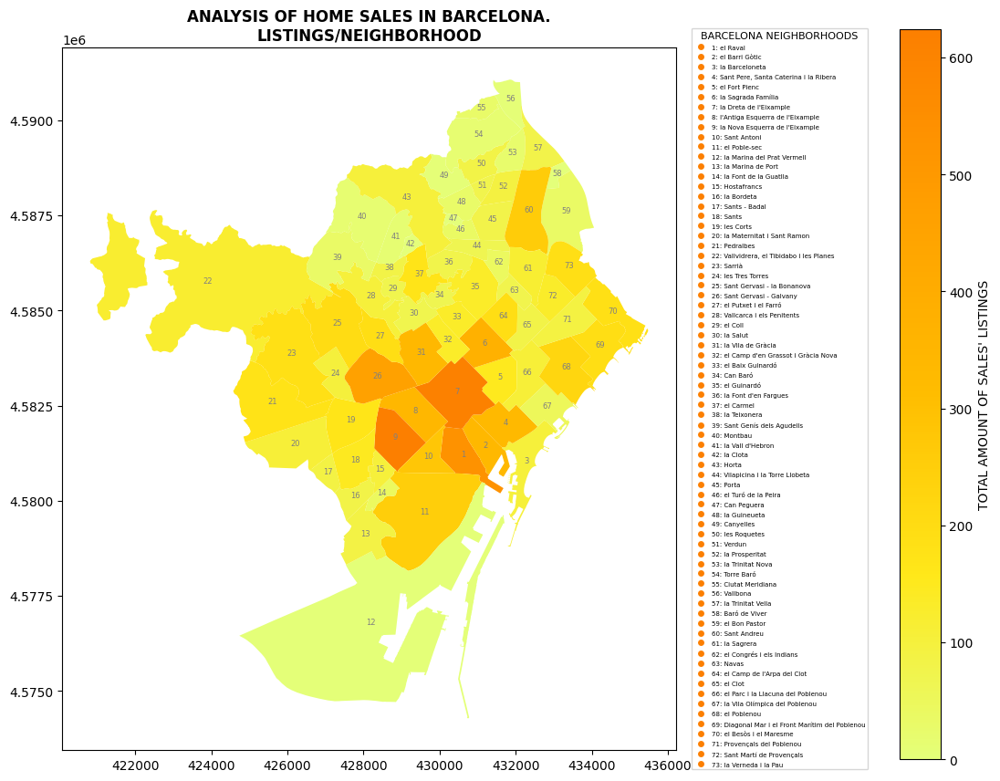

In [11]:

fig, ax = plt.subplots(figsize=(15, 10))
totcol = cm.Wistia

# Plot gdfb with the "AdvIn" column
gdfb.plot(column="AdvIn", cmap=totcol, ax=ax)

# Add names of 'BARRI' in the centers of polygons
for idx, row in gdfb.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['BARRI'], ha='center', fontsize=6, color='gray')

# Create a colorbar
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap=totcol)
sm.set_array(gdfb['AdvIn'])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("TOTAL AMOUNT OF SALES' LISTINGS")

# Create legend with two columns
handles, labels = [], []
for idx, row in gdfb.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=totcol(1.0)))
    labels.append(f"{row['BARRI']}: {row['NOM']}")
    
num_columns = 1
legend = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='BARCELONA NEIGHBORHOODS', ncol=num_columns, fontsize=5, labelspacing=0.7)
legend.get_title().set_fontsize(8)

ax.set_title("ANALYSIS OF HOME SALES IN BARCELONA.\nLISTINGS/NEIGHBORHOOD", fontsize=12, fontweight='bold')

plt.show()

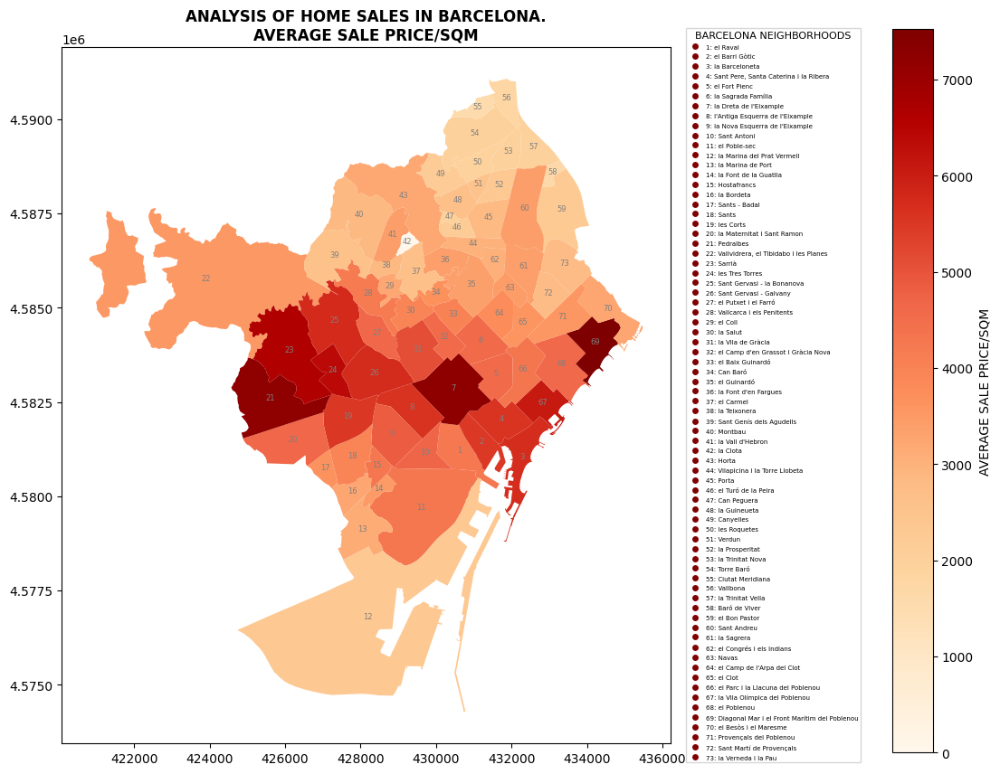

In [12]:
fig, ax = plt.subplots(figsize=(15, 10))
totcol = cm.OrRd
collo = 'AvePBA'

gdfb.plot(column=collo, cmap=totcol, ax=ax)

# Add names of 'BARRI' in the centers of polygons
for idx, row in gdfb.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['BARRI'], ha='center', fontsize=6, color='gray')

# Create a colorbar
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap=totcol)
sm.set_array(gdfb[collo])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("AVERAGE SALE PRICE/SQM")

# Create legend of neighborhoods
handles, labels = [], []
for idx, row in gdfb.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=totcol(1.0)))
    labels.append(f"{row['BARRI']}: {row['NOM']}")
    
num_columns = 1
legend = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='BARCELONA NEIGHBORHOODS', ncol=num_columns, fontsize=5, labelspacing=0.7)
legend.get_title().set_fontsize(8)

ax.set_title("ANALYSIS OF HOME SALES IN BARCELONA.\nAVERAGE SALE PRICE/SQM", fontsize=12, fontweight='bold')

plt.show()

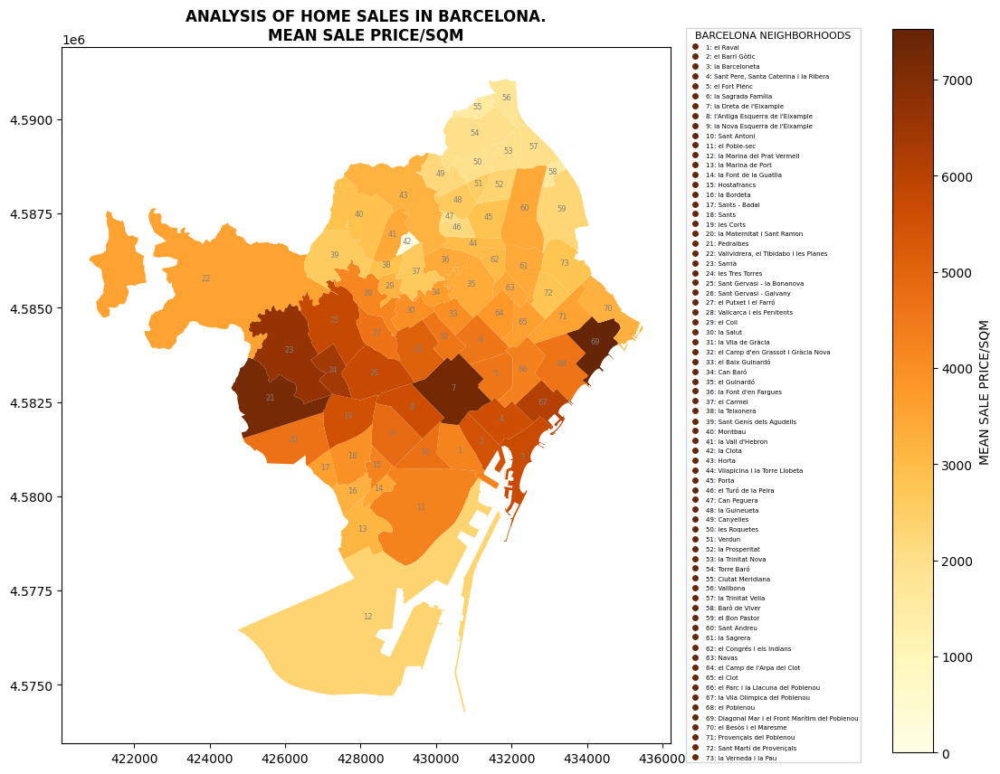

In [13]:
fig, ax = plt.subplots(figsize=(15, 10))
totcol = cm.YlOrBr
collo = 'MeanPBA'

gdfb.plot(column=collo, cmap=totcol, ax=ax)

# Add names of 'BARRI' in the centers of polygons
for idx, row in gdfb.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['BARRI'], ha='center', fontsize=6, color='gray')

# Create a colorbar
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap=totcol)
sm.set_array(gdfb[collo])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("MEAN SALE PRICE/SQM")

# Create legend of neighborhoods
handles, labels = [], []
for idx, row in gdfb.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=totcol(1.0)))
    labels.append(f"{row['BARRI']}: {row['NOM']}")
    
num_columns = 1
legend = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='BARCELONA NEIGHBORHOODS', ncol=num_columns, fontsize=5, labelspacing=0.7)
legend.get_title().set_fontsize(8)

ax.set_title("ANALYSIS OF HOME SALES IN BARCELONA.\nMEAN SALE PRICE/SQM", fontsize=12, fontweight='bold')

plt.show()

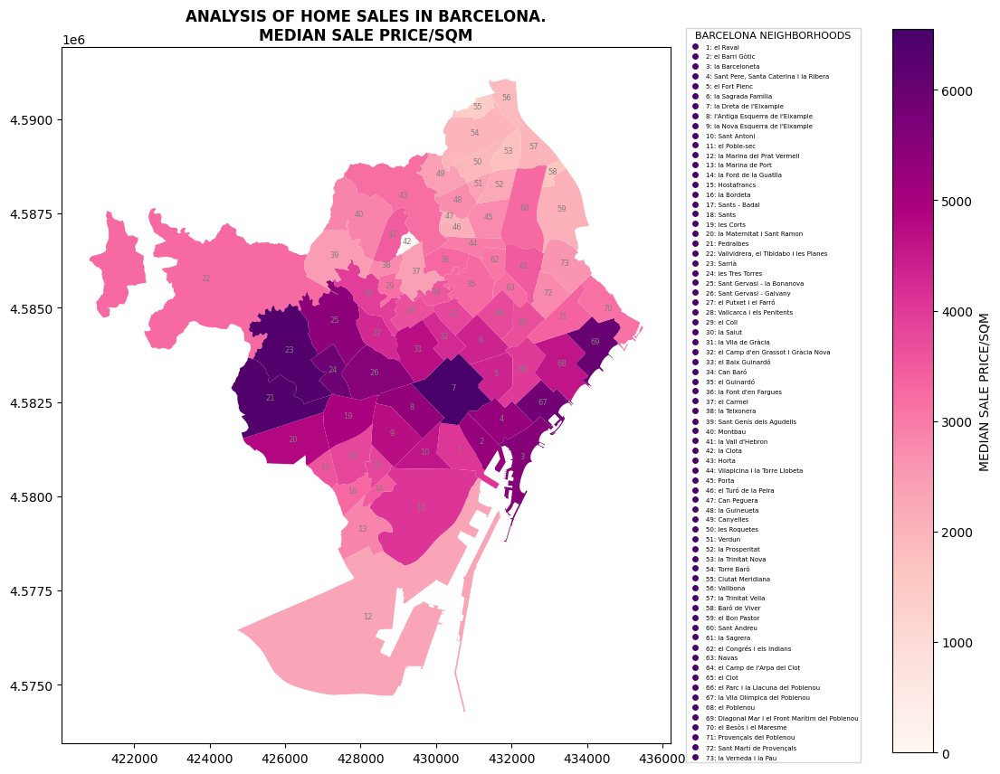

In [14]:
fig, ax = plt.subplots(figsize=(15, 10))
totcol = cm.RdPu
collo = 'MedPBA'

gdfb.plot(column=collo, cmap=totcol, ax=ax)

# Add names of 'BARRI' in the centers of polygons
for idx, row in gdfb.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['BARRI'], ha='center', fontsize=6, color='gray')

# Create a colorbar
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap=totcol)
sm.set_array(gdfb[collo])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("MEDIAN SALE PRICE/SQM")

# Create legend of neighborhoods
handles, labels = [], []
for idx, row in gdfb.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=totcol(1.0)))
    labels.append(f"{row['BARRI']}: {row['NOM']}")
    
num_columns = 1
legend = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='BARCELONA NEIGHBORHOODS', ncol=num_columns, fontsize=5, labelspacing=0.7)
legend.get_title().set_fontsize(8)

ax.set_title("ANALYSIS OF HOME SALES IN BARCELONA.\nMEDIAN SALE PRICE/SQM", fontsize=12, fontweight='bold')

plt.show()

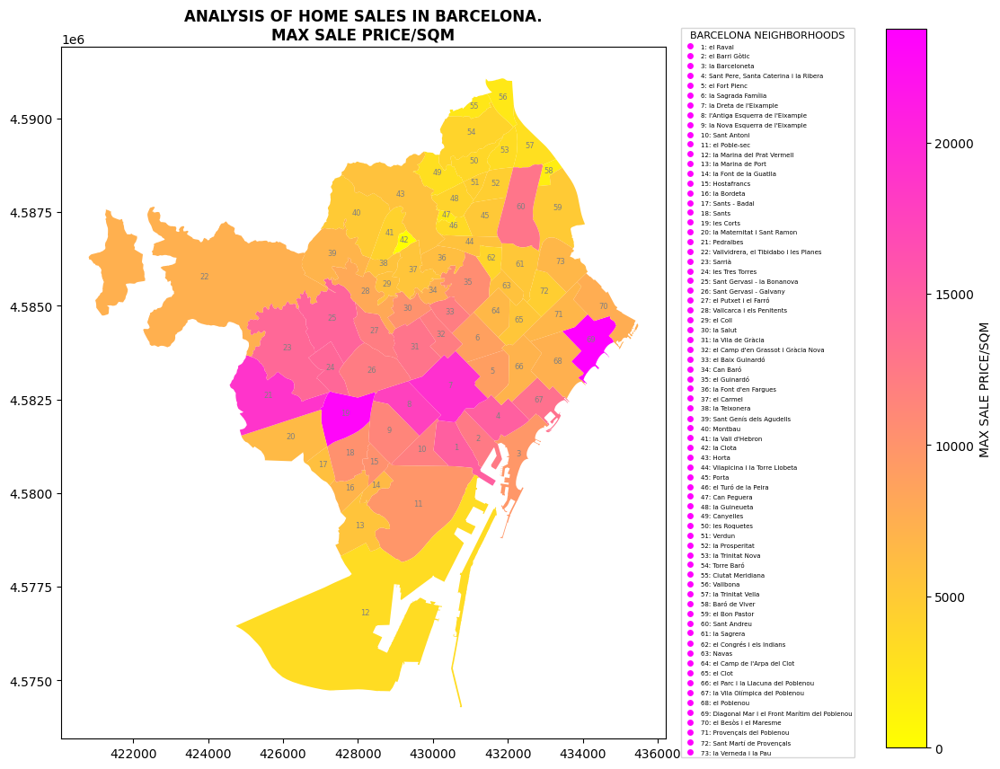

In [15]:
fig, ax = plt.subplots(figsize=(15, 10))
totcol = cm.spring_r
collo = 'MaxPBA'

gdfb.plot(column=collo, cmap=totcol, ax=ax)

# Add names of 'BARRI' in the centers of polygons
for idx, row in gdfb.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['BARRI'], ha='center', fontsize=6, color='gray')

# Create a colorbar
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap=totcol)
sm.set_array(gdfb[collo])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("MAX SALE PRICE/SQM")

# Create legend of neighborhoods
handles, labels = [], []
for idx, row in gdfb.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=totcol(1.0)))
    labels.append(f"{row['BARRI']}: {row['NOM']}")
    
num_columns = 1
legend = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='BARCELONA NEIGHBORHOODS', ncol=num_columns, fontsize=5, labelspacing=0.7)
legend.get_title().set_fontsize(8)

ax.set_title("ANALYSIS OF HOME SALES IN BARCELONA.\nMAX SALE PRICE/SQM", fontsize=12, fontweight='bold')

plt.show()

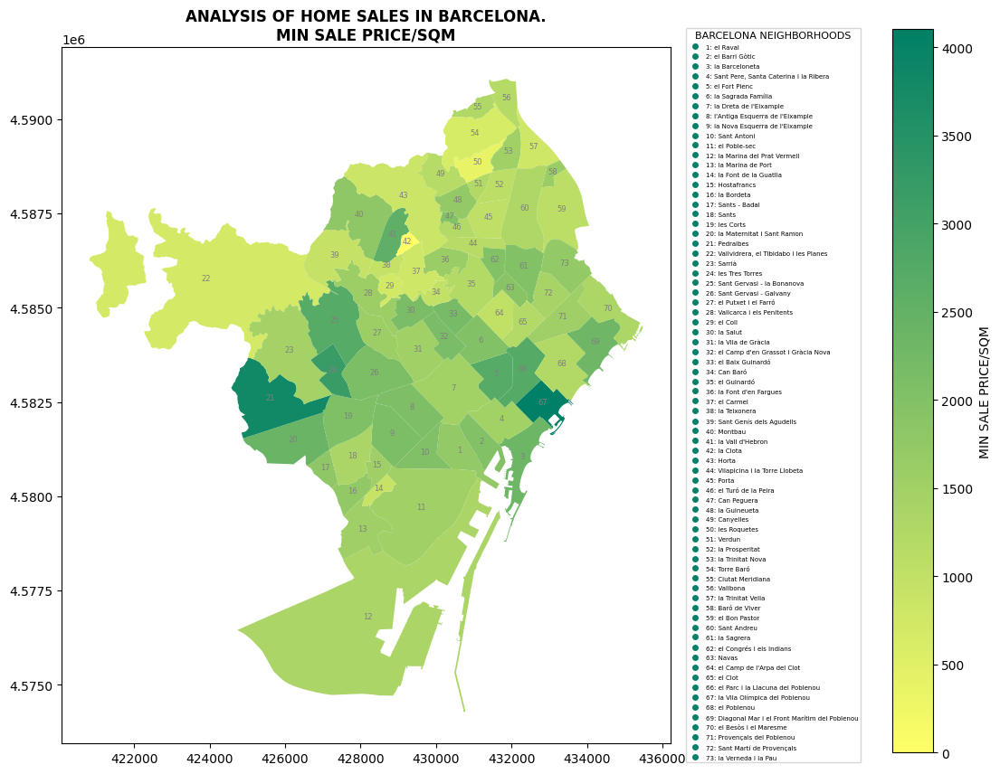

In [16]:
fig, ax = plt.subplots(figsize=(15, 10))
totcol = cm.summer_r
collo = 'MinPBA'

gdfb.plot(column=collo, cmap=totcol, ax=ax)

# Add names of 'BARRI' in the centers of polygons
for idx, row in gdfb.iterrows():
    centroid = row['geometry'].centroid
    ax.text(centroid.x, centroid.y, row['BARRI'], ha='center', fontsize=6, color='gray')

# Create a colorbar
cax = fig.add_axes([0.9, 0.1, 0.03, 0.8])
sm = plt.cm.ScalarMappable(cmap=totcol)
sm.set_array(gdfb[collo])
cbar = plt.colorbar(sm, cax=cax)
cbar.set_label("MIN SALE PRICE/SQM")

# Create legend of neighborhoods
handles, labels = [], []
for idx, row in gdfb.iterrows():
    handles.append(plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=totcol(1.0)))
    labels.append(f"{row['BARRI']}: {row['NOM']}")
    
num_columns = 1
legend = ax.legend(handles, labels, loc='center left', bbox_to_anchor=(1.02, 0.5), title='BARCELONA NEIGHBORHOODS', ncol=num_columns, fontsize=5, labelspacing=0.7)
legend.get_title().set_fontsize(8)

ax.set_title("ANALYSIS OF HOME SALES IN BARCELONA.\nMIN SALE PRICE/SQM", fontsize=12, fontweight='bold')

plt.show()

In [17]:
#Let's clusterize listing points by K-means and Price per SQM
from sklearn.cluster import KMeans

# Drop missing values in 'PriceByAre' column
gdfax = gdfa.dropna(subset=['PriceByAre'])

# Clusterize using K-Means algorithm
X = gdfax[['PriceByAre']]

kmeans = KMeans(n_clusters=5)  # Set the desired number of clusters
kmeans.fit(X)

# Add cluster labels to the dataframe
gdfax['Cluster'] = kmeans.labels_

# Create buffers around cluster centroids
buffers = gdfax.dissolve(by='Cluster').buffer(100)

# Convert buffers to a separate GeoDataFrame
buffer_gdf = gpd.GeoDataFrame(geometry=buffers)
buffer_gdf.crs = gdfax.crs

# Create a folium map centered at the mean coordinates of the data
m = folium.Map(location=[latitude, longitude], zoom_start=12)
folium.TileLayer('cartodbpositron').add_to(m)

# Add buffers to the map
folium.GeoJson(buffer_gdf, style_function=lambda x: {'color': 'red'}).add_to(m)

# Display the map
m

C:\Users\rromu\AppData\Roaming\Python\Python39\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [18]:
# Create buffers around cluster centroids
buffers = gdfax.dissolve(by='Cluster').buffer(100)

# Convert buffers to a separate GeoDataFrame
buffer_gdf = gpd.GeoDataFrame(geometry=buffers).reset_index()

# Add cluster labels to the buffer GeoDataFrame
buffer_gdf['Cluster'] = buffer_gdf['Cluster'].astype(int)

# Create a colormap with hsv colors
colormap = cm.gnuplot

# Determine the maximum cluster label
max_cluster = buffer_gdf['Cluster'].max()

# Create a color map based on the maximum cluster label
color_map = [colors.rgb2hex(colormap(i / max_cluster)) for i in range(max_cluster + 1)]

# Create a folium map centered at the mean coordinates of the data
m = folium.Map(location=[latitude, longitude], zoom_start=12)
folium.TileLayer('cartodbpositron').add_to(m)

# Add buffers to the map with recolored style
folium.GeoJson(
    buffer_gdf,
    style_function=lambda feature: {
        'color': color_map[feature['properties']['Cluster']],
        'fillColor': color_map[feature['properties']['Cluster']],
        'fillOpacity': 0.4
    }
).add_to(m)

# Add legend
legend_html = '''
     <div style="position: fixed; 
                 bottom: 30px; right: 30px; width: 70px; height: 160px; z-index:9999; font-size:14px;
                 background-color:white; opacity: 0.8;
                 ">
       &nbsp;<b>Cluster Legend</b><br>
       <br>
       %s
     </div>
''' % (
    '<br>'.join(['<span style="color: {0};">Cluster {1}</span>'.format(color_map[i], i) for i in range(max_cluster + 1)])
)

m.get_root().html.add_child(folium.Element(legend_html))

# Display the map
m

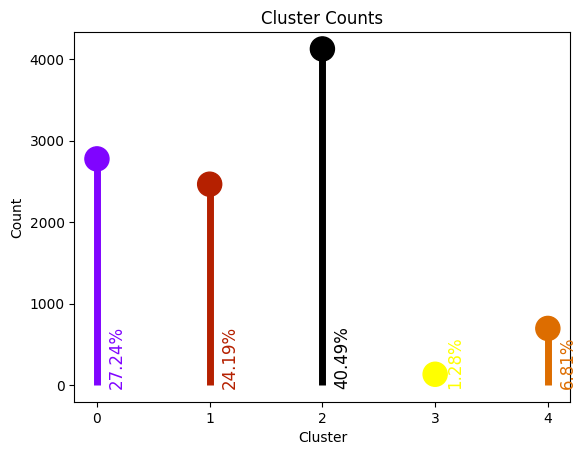

In [19]:
# Count the number of values in each cluster
cluster_counts = gdfax['Cluster'].value_counts()

# Get the cluster labels and their corresponding counts
cluster_labels = cluster_counts.index
counts = cluster_counts.values

# Calculate the total count
total_count = counts.sum()

# Calculate the percentage values
percentages = (counts / total_count) * 100

# Create a colormap with gnuplot colors
colormap = cm.gnuplot

# Determine the maximum cluster label
max_cluster = gdfax['Cluster'].max()

# Create a color map based on the maximum cluster label
colors = [colormap(i / max_cluster) for i in range(max_cluster + 1)]

# Create the lollipop graph
fig, ax = plt.subplots()

# Plot the lollipops
ax.vlines(cluster_labels, 0, counts, color=colors, lw=5)
ax.scatter(cluster_labels, counts, color=colors, s=300)

# Add the percentages slightly away from the start of the vlines
for label, percentage, color in zip(cluster_labels, percentages, colors):
    formatted_percentage = '{:.2f}%'.format(percentage)
    ax.text(label + 0.1, 0, formatted_percentage, rotation='vertical', ha='left', va='baseline', color=color, fontsize=12)

# Set labels and title
ax.set_xlabel('Cluster')
ax.set_ylabel('Count')
ax.set_title('Cluster Counts')

# Set x-axis tick labels
ax.set_xticks(cluster_labels)
ax.set_xticklabels(cluster_labels)

# Show the plot
plt.show()

In [20]:
buffer_gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   Cluster   5 non-null      int32   
 1   geometry  5 non-null      geometry
dtypes: geometry(1), int32(1)
memory usage: 188.0 bytes


In [22]:
gdfa.to_file('C:/WORK_IAAC/submissions/Data Science III/datascience_III_src/fotocasa_2018_3.shp',  driver='ESRI Shapefile')
gdfb.to_file('C:/WORK_IAAC/submissions/Data Science III/datascience_III_src/BCN_barrios_RE.shp',  driver='ESRI Shapefile')
gdfax.to_file('C:/WORK_IAAC/submissions/Data Science III/datascience_III_src/fotocasa_2018_cluster5.shp',  driver='ESRI Shapefile')
buffer_gdf.to_file('C:/WORK_IAAC/submissions/Data Science III/datascience_III_src/5_clusterprices.shp' , driver='ESRI Shapefile')